In [1]:
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

from matplotlib import pyplot as plt
import numpy as np

import os

In [4]:
train_images = tf.keras.utils.image_dataset_from_directory(
    "dataset/Training", label_mode=None, image_size=(64, 64), batch_size=236 # update from 32
)

Found 47009 files belonging to 1 classes.


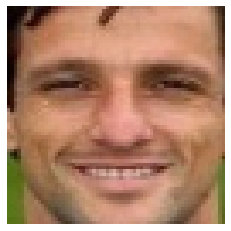

In [5]:
image_batch = next(iter(train_images))
random_index = np.random.choice(image_batch.shape[0])
random_image = image_batch[random_index].numpy().astype("int32")

# Visualize 1 random image from the training dataset
plt.axis("off")
plt.imshow(random_image)
plt.show()

In [6]:
def show(images):
    plt.figure(figsize=(4, 4))

    for i in range(16):
        plt.subplot(4, 4, i+1)
        img = keras.utils.array_to_img(images[i]) 
        plt.imshow(img)
        plt.axis('off') 
    plt.show()

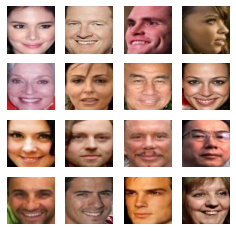

In [7]:
# Visualize 16 images from the training dataset
show(image_batch[:16])

In [8]:
# Normalize the images to [-1, 1] which is the range of the tanh activation
train_images = train_images.map(lambda x: (x - 127.5) / 127.5)

In [9]:
# latent dimension of the random noise
LATENT_DIM = 128 
# weight initializer for G per DCGAN paper 
WEIGHT_INIT = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02) 
# number of channels, 1 for gray scale and 3 for color images
CHANNELS = 3  

In [10]:
def build_generator():
    # create a Keras Sequential model 
    model = Sequential(name="generator")

    # prepare for reshape: FC => BN => RN layers, note: input shape defined in the 1st Dense layer  
    model.add(layers.Dense(8 * 8 * 512, input_dim=LATENT_DIM))
    model.add(layers.BatchNormalization()) 
    model.add(layers.LeakyReLU())
    # layers.LeakyReLU(alpha=0.2),

    # 1D => 3D: reshape the output of the previous layer 
    model.add(layers.Reshape((8, 8, 512)))

    # upsample to 16x16: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(256, (4, 4), 
                                     strides=(2, 2), 
                                     padding="same", 
                                     use_bias=False, 
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization()) # Margaret exp: add back bach norm
    model.add((layers.LeakyReLU()))

    # upsample to 32x32: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(128, (4, 4), 
                                     strides=(2, 2), 
                                     padding="same", 
                                     use_bias=False, 
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization()) # Margaret exp: add back bach norm
    model.add((layers.LeakyReLU()))

    # upsample to 64x64: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(64, (4, 4), 
                                     strides=(2, 2), 
                                     padding="same", 
                                     use_bias=False, 
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization()) # Margaret exp: add back bach norm
    model.add((layers.LeakyReLU()))

    # final layer: Conv2D with tanh activation
    model.add(layers.Conv2D(CHANNELS, (4, 4), padding="same", activation="tanh"))

    # return the generator model
    return model

In [11]:
# build the generator model
generator = build_generator()

In [12]:
generator.summary()

Model: "generator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 32768)             4227072   
_________________________________________________________________
batch_normalization (BatchNo (None, 32768)             131072    
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 32768)             0         
_________________________________________________________________
reshape (Reshape)            (None, 8, 8, 512)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 16, 16, 256)       2097152   
_________________________________________________________________
batch_normalization_1 (Batch (None, 16, 16, 256)       1024      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 16, 16, 256)       0 

In [13]:
# UPDATE for WGAN: a new class implementing weight clipping constraint
class WeightClipping(tf.keras.constraints.Constraint):
    def __init__(self, clip_value):
        self.clip_value = clip_value
    
    def __call__(self, weights):
        return tf.clip_by_value(weights, -self.clip_value, self.clip_value)
    
    def get_config(self):
        return {'clip_value': self.clip_value}

In [14]:
def build_critic(height, width, depth, alpha=0.2):
    #UPDATE for WGAN: enfoce 1-Lipschitz constraint with weight clippping to [-1, 1] 
    constraint = WeightClipping(0.01)

    # create a Keras Sequential model
    model = Sequential(name="critic")
    input_shape = (height, width, depth)

    # 1. first set of CONV => BN => leaky ReLU layers
    model.add(layers.Conv2D(64, (4, 4), padding="same", 
                            strides=(2, 2),
                            kernel_constraint = constraint, # UPDATE for WGAN
                            input_shape=input_shape))
    model.add(layers.BatchNormalization()) 
    model.add(layers.LeakyReLU(alpha=alpha))

    # 2. second set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4), padding="same", 
                            strides=(2, 2), 
                            kernel_constraint = constraint,)) # UPDATE for WGAN
    model.add(layers.BatchNormalization()) 
    model.add(layers.LeakyReLU(alpha=alpha))

    # 3. third set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4), padding="same", 
                            strides=(2, 2),
                            kernel_constraint = constraint,)) # UPDATE for WGAN
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=alpha))

    # flatten and apply dropout
    model.add(layers.Flatten())
    model.add(layers.Dropout(0.5)) 

    # UPDATE for WGAN: linear activation in the last layer. 
    # Note: Keras `Dense` layer by default is already a `linear` activation
    model.add(layers.Dense(1, activation="linear"))

    # return the critic model
    return model

In [15]:
# build the critic model
critic = build_critic(64, 64, 3) 

In [16]:
critic.summary()

Model: "critic"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 32, 32, 64)        3136      
_________________________________________________________________
batch_normalization_4 (Batch (None, 32, 32, 64)        256       
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 16, 16, 128)       131200    
_________________________________________________________________
batch_normalization_5 (Batch (None, 16, 16, 128)       512       
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 8, 8, 128)         26227

In [17]:
class WGAN(keras.Model):
    def __init__(self, 
                 critic, 
                 generator, 
                 latent_dim, 
                 critic_extra_steps): # UPDATE
        super().__init__()
        self.critic = critic
        self.generator = generator
        self.latent_dim = latent_dim
        self.c_extra_steps = critic_extra_steps
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    def compile(self, d_optimizer, g_optimizer, d_loss_fn, g_loss_fn):
        super(WGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.d_loss_fn = d_loss_fn
        self.g_loss_fn = g_loss_fn

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    # UPDATE for WGAN: remove the code of real / fake labels
    def train_step(self, real_images):

        batch_size = tf.shape(real_images)[0]
        noise = tf.random.normal(shape=(batch_size, self.latent_dim))

        # UPDATE for WGAN: we train the critic more often than the generator by 5 times (self.c_extra_steps) 
        for i in range(self.c_extra_steps):
            # Step 1. Train the critic with both real images and fake images 
            with tf.GradientTape() as tape:
                # Get the critic' predictions on the real images
                pred_real = self.critic(real_images, training=True)
                # Generate fake images from the latent noise
                fake_images = self.generator(noise, training=True) 
                # Get the critic' predictions on the fake images
                pred_fake = self.critic(fake_images, training=True)
                # Calculate the critic loss with wassertein loss function
                d_loss = self.d_loss_fn(pred_real, pred_fake)
            # Compute critic gradients
            grads = tape.gradient(d_loss, self.critic.trainable_variables)
            # Update critic weights
            self.d_optimizer.apply_gradients(zip(grads, self.critic.trainable_variables))

        # Step 2. Train the generator (do not update weights of the critic)
        with tf.GradientTape() as tape:
            fake_images = self.generator(noise, training=True)
            pred_fake = self.critic(fake_images, training=True)
            g_loss = self.g_loss_fn(pred_fake) 
        # Compute generator gradients
        grads = tape.gradient(g_loss, self.generator.trainable_variables)
        # Update generator weights
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_variables))

        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {"d_loss": self.d_loss_metric.result(), "g_loss": self.g_loss_metric.result()}

In [18]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=100):
        self.num_img = num_img
        self.latent_dim = latent_dim

        # Create random noise seed for visualization during traing
        self.seed = tf.random.normal([16, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.generator(self.seed)
        generated_images = (generated_images * 127.5) + 127.5
        generated_images.numpy()

        fig = plt.figure(figsize=(4, 4))
        for i in range(self.num_img):
            plt.subplot(4, 4, i+1)
            img = keras.utils.array_to_img(generated_images[i]) 
            plt.imshow(img)
            plt.axis('off')
        plt.savefig('epoch_{:03d}.png'.format(epoch)) 
        plt.show()

    def on_train_end(self, logs=None):
        self.model.generator.save('generator.h5')

In [19]:
wgan = WGAN(critic=critic, 
              generator=generator, 
              latent_dim=LATENT_DIM,
              critic_extra_steps=5) # UPDATE for WGAN

In [20]:
# Wasserstein loss for the critic
def d_wasserstein_loss(pred_real, pred_fake):
    real_loss = tf.reduce_mean(pred_real)
    fake_loss = tf.reduce_mean(pred_fake)
    return fake_loss - real_loss

# Wasserstein loss for the generator
def g_wasserstein_loss(pred_fake):
    return -tf.reduce_mean(pred_fake)

In [21]:
LR = 0.0001 # UPDATE for WGAN: learning rate per WGAN paper

In [22]:
wgan.compile(
    d_optimizer = keras.optimizers.RMSprop(learning_rate=0.0001, clipvalue=1.0, decay=1e-8), # UPDATE for WGAN: use RMSProp instead of Adam
    g_optimizer = keras.optimizers.RMSprop(learning_rate=0.0001, clipvalue=1.0, decay=1e-8), # UPDATE for WGAN: use RMSProp instead of Adam
    d_loss_fn = d_wasserstein_loss,
    g_loss_fn = g_wasserstein_loss
)

Epoch 1/200


2022-05-30 09:45:41.759541: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8201
2022-05-30 09:45:42.211253: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-05-30 09:45:42.212350: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-05-30 09:45:42.212418: W tensorflow/stream_executor/gpu/asm_compiler.cc:77] Couldn't get ptxas version string: Internal: Couldn't invoke ptxas --version
2022-05-30 09:45:42.213093: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-05-30 09:45:42.213215: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] Internal: Failed to launch ptxas
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.


200/200 [==============================] - 144s 638ms/step - d_loss: -468.8587 - g_loss: 229.8944


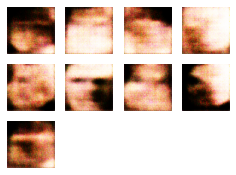

Epoch 2/200
200/200 [==============================] - 127s 632ms/step - d_loss: -1562.1587 - g_loss: 775.5844


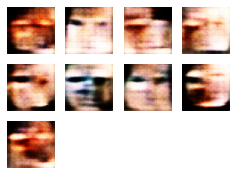

Epoch 3/200
200/200 [==============================] - 127s 631ms/step - d_loss: -2972.7241 - g_loss: 1457.3032


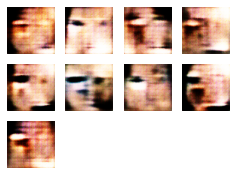

Epoch 4/200
200/200 [==============================] - 128s 632ms/step - d_loss: -4505.2051 - g_loss: 2241.4851


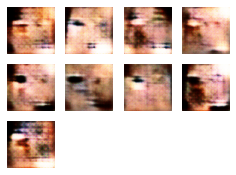

Epoch 5/200
200/200 [==============================] - 127s 632ms/step - d_loss: -6481.4600 - g_loss: 3186.9534


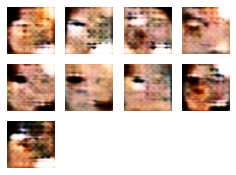

Epoch 6/200
200/200 [==============================] - 127s 630ms/step - d_loss: -8807.3633 - g_loss: 4289.1963


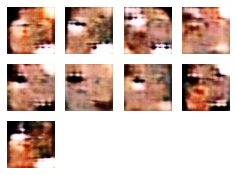

Epoch 7/200
200/200 [==============================] - 127s 631ms/step - d_loss: -10930.2959 - g_loss: 5282.6875


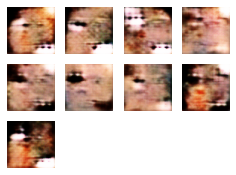

Epoch 8/200
200/200 [==============================] - 127s 631ms/step - d_loss: -12437.2402 - g_loss: 5912.6411


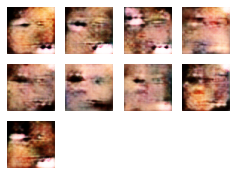

Epoch 9/200
200/200 [==============================] - 127s 631ms/step - d_loss: -12993.3447 - g_loss: 5770.6431


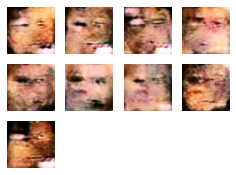

Epoch 10/200
200/200 [==============================] - 127s 630ms/step - d_loss: -12253.4717 - g_loss: 5419.0513


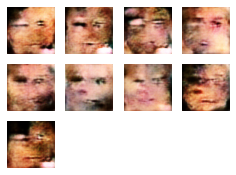

Epoch 11/200
200/200 [==============================] - 127s 631ms/step - d_loss: -12291.9717 - g_loss: 4792.5205


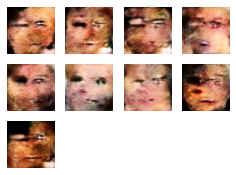

Epoch 12/200
200/200 [==============================] - 127s 631ms/step - d_loss: -12341.1074 - g_loss: 4407.3735


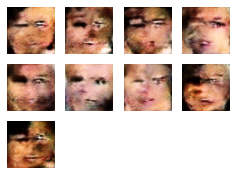

Epoch 13/200
200/200 [==============================] - 127s 631ms/step - d_loss: -12451.5010 - g_loss: 3906.2129


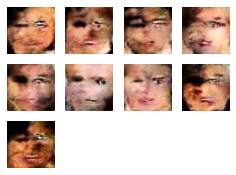

Epoch 14/200
200/200 [==============================] - 128s 633ms/step - d_loss: -13115.6035 - g_loss: 3721.0164


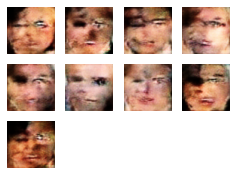

Epoch 15/200
200/200 [==============================] - 128s 631ms/step - d_loss: -14879.2549 - g_loss: 3384.4268


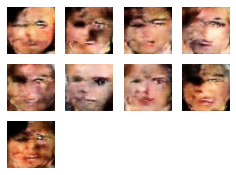

Epoch 16/200
200/200 [==============================] - 127s 631ms/step - d_loss: -16253.2197 - g_loss: 4064.3572


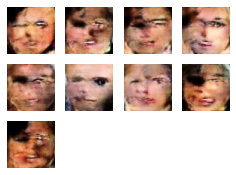

Epoch 17/200
200/200 [==============================] - 127s 631ms/step - d_loss: -16377.4834 - g_loss: 4076.7263


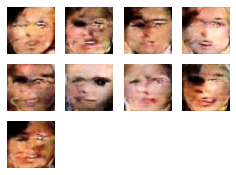

Epoch 18/200
200/200 [==============================] - 127s 631ms/step - d_loss: -16984.0508 - g_loss: 4161.0063


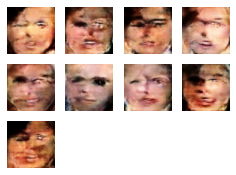

Epoch 19/200
200/200 [==============================] - 127s 632ms/step - d_loss: -18156.4043 - g_loss: 4947.0190


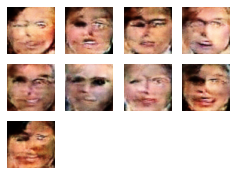

Epoch 20/200
200/200 [==============================] - 127s 631ms/step - d_loss: -18786.4805 - g_loss: 5569.2358


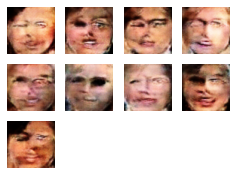

Epoch 21/200
200/200 [==============================] - 127s 630ms/step - d_loss: -19429.8906 - g_loss: 4548.9512


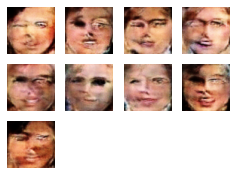

Epoch 22/200
200/200 [==============================] - 127s 631ms/step - d_loss: -20600.4766 - g_loss: 5168.8149


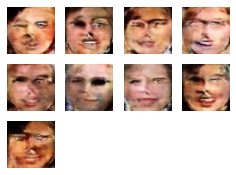

Epoch 23/200
200/200 [==============================] - 127s 631ms/step - d_loss: -21509.7383 - g_loss: 3750.7380


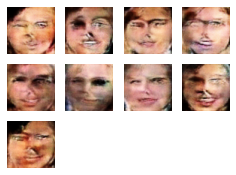

Epoch 24/200
200/200 [==============================] - 127s 630ms/step - d_loss: -22610.1680 - g_loss: 3493.0759


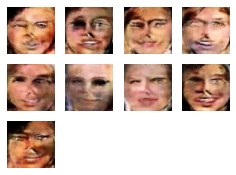

Epoch 25/200
200/200 [==============================] - 127s 631ms/step - d_loss: -22864.5527 - g_loss: 2457.9990


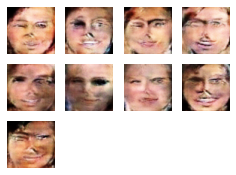

Epoch 26/200
200/200 [==============================] - 128s 633ms/step - d_loss: -23378.5000 - g_loss: 538.8405


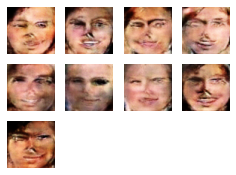

Epoch 27/200
200/200 [==============================] - 127s 631ms/step - d_loss: -24627.5859 - g_loss: 57.9073


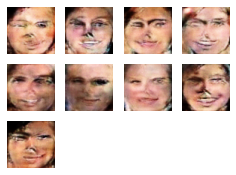

Epoch 28/200
200/200 [==============================] - 127s 630ms/step - d_loss: -25259.7266 - g_loss: -1025.4279


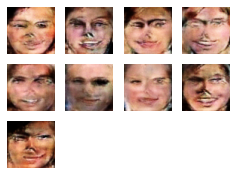

Epoch 29/200
200/200 [==============================] - 127s 630ms/step - d_loss: -26772.5547 - g_loss: 802.6326


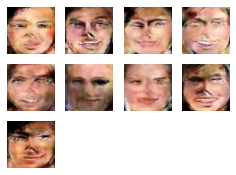

Epoch 30/200
200/200 [==============================] - 127s 631ms/step - d_loss: -28094.4453 - g_loss: -830.6116


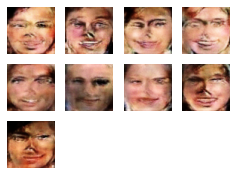

Epoch 31/200
200/200 [==============================] - 127s 630ms/step - d_loss: -29470.9219 - g_loss: -1330.2059


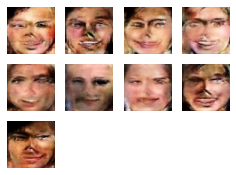

Epoch 32/200
200/200 [==============================] - 127s 631ms/step - d_loss: -29725.2695 - g_loss: -2341.8516


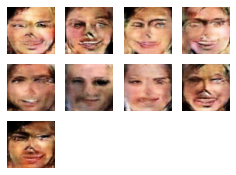

Epoch 33/200
200/200 [==============================] - 127s 631ms/step - d_loss: -31200.5332 - g_loss: -2451.2874


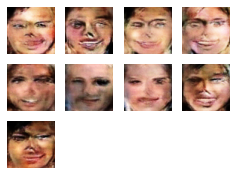

Epoch 34/200
200/200 [==============================] - 127s 630ms/step - d_loss: -33054.6758 - g_loss: -4833.3193


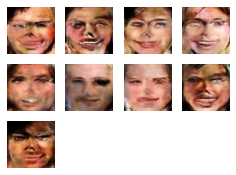

Epoch 35/200
200/200 [==============================] - 127s 631ms/step - d_loss: -33204.0156 - g_loss: -2452.5549


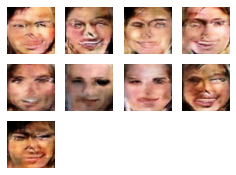

Epoch 36/200
200/200 [==============================] - 127s 631ms/step - d_loss: -34811.4219 - g_loss: -4789.1094


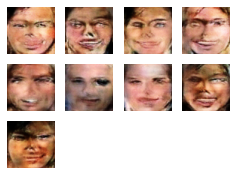

Epoch 37/200
200/200 [==============================] - 127s 630ms/step - d_loss: -34924.9297 - g_loss: -5578.5811


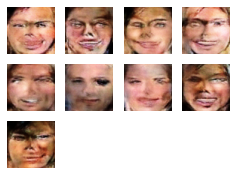

Epoch 38/200
200/200 [==============================] - 127s 630ms/step - d_loss: -38123.8242 - g_loss: -3036.3628


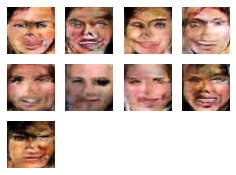

Epoch 39/200
200/200 [==============================] - 127s 630ms/step - d_loss: -38612.8867 - g_loss: -9092.2910


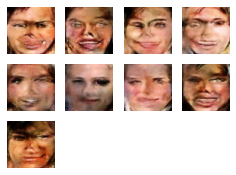

Epoch 40/200
200/200 [==============================] - 127s 631ms/step - d_loss: -39562.0430 - g_loss: -7497.9224


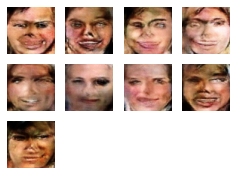

Epoch 41/200
200/200 [==============================] - 127s 630ms/step - d_loss: -41041.6758 - g_loss: -4967.8911


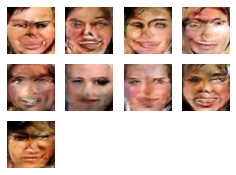

Epoch 42/200
200/200 [==============================] - 127s 630ms/step - d_loss: -41422.9375 - g_loss: -7163.1543


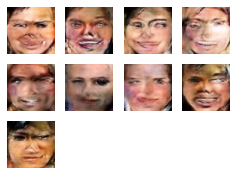

Epoch 43/200
200/200 [==============================] - 127s 630ms/step - d_loss: -44516.0234 - g_loss: -8669.8408


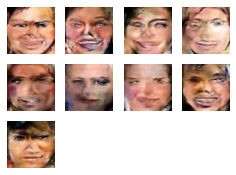

Epoch 44/200
200/200 [==============================] - 127s 630ms/step - d_loss: -45773.8594 - g_loss: -7822.5640


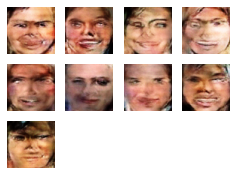

Epoch 45/200
200/200 [==============================] - 127s 631ms/step - d_loss: -45518.4883 - g_loss: -8068.3667


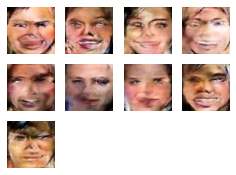

Epoch 46/200
200/200 [==============================] - 128s 633ms/step - d_loss: -48796.1562 - g_loss: -9576.1279


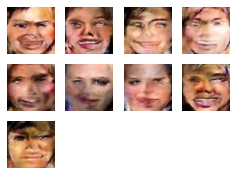

Epoch 47/200
200/200 [==============================] - 127s 631ms/step - d_loss: -50288.6719 - g_loss: -6445.7080


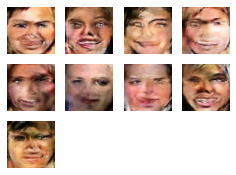

Epoch 48/200
200/200 [==============================] - 127s 631ms/step - d_loss: -53911.4102 - g_loss: -9111.8555


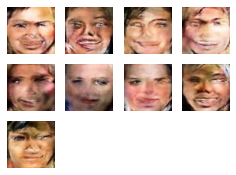

Epoch 49/200
200/200 [==============================] - 127s 630ms/step - d_loss: -55023.3984 - g_loss: -13346.0986


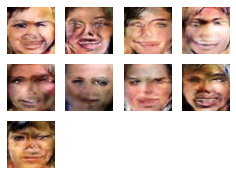

Epoch 50/200
200/200 [==============================] - 127s 630ms/step - d_loss: -55520.4766 - g_loss: -12659.2852


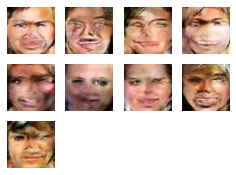

Epoch 51/200
200/200 [==============================] - 127s 630ms/step - d_loss: -57629.8047 - g_loss: -11638.2129


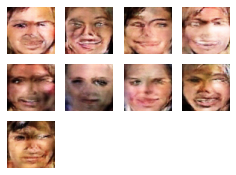

Epoch 52/200
200/200 [==============================] - 127s 630ms/step - d_loss: -59927.9414 - g_loss: -15041.5615


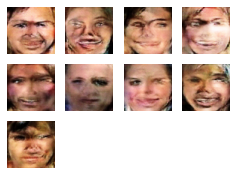

Epoch 53/200
200/200 [==============================] - 127s 631ms/step - d_loss: -61650.1367 - g_loss: -14044.9248


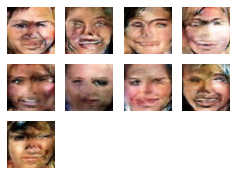

Epoch 54/200
200/200 [==============================] - 127s 631ms/step - d_loss: -62720.6953 - g_loss: -10047.6738


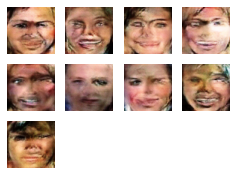

Epoch 55/200
200/200 [==============================] - 127s 630ms/step - d_loss: -66170.5078 - g_loss: -9304.3848


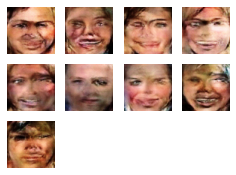

Epoch 56/200
200/200 [==============================] - 127s 630ms/step - d_loss: -66470.8438 - g_loss: -11012.4824


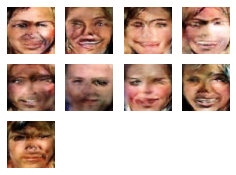

Epoch 57/200
200/200 [==============================] - 127s 631ms/step - d_loss: -69680.1797 - g_loss: -16883.8633


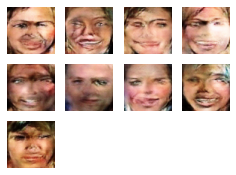

Epoch 58/200
200/200 [==============================] - 127s 630ms/step - d_loss: -72434.9531 - g_loss: -13157.0547


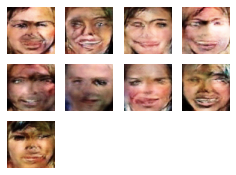

Epoch 59/200
200/200 [==============================] - 127s 630ms/step - d_loss: -74282.3203 - g_loss: -13976.0967


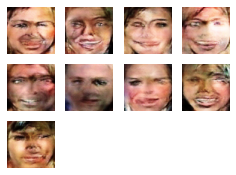

Epoch 60/200
200/200 [==============================] - 127s 631ms/step - d_loss: -75005.0156 - g_loss: -18508.4902


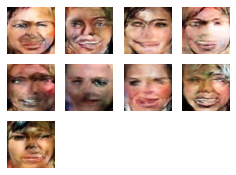

Epoch 61/200
200/200 [==============================] - 127s 631ms/step - d_loss: -75060.0625 - g_loss: -17260.3457


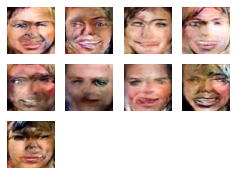

Epoch 62/200
200/200 [==============================] - 127s 630ms/step - d_loss: -80679.3359 - g_loss: -18861.2363


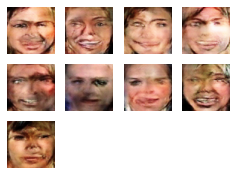

Epoch 63/200
200/200 [==============================] - 127s 630ms/step - d_loss: -83977.8203 - g_loss: -14848.7578


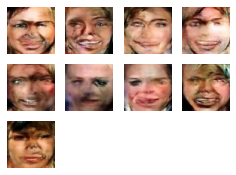

Epoch 64/200
200/200 [==============================] - 127s 631ms/step - d_loss: -84076.5312 - g_loss: -13992.5625


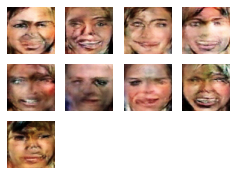

Epoch 65/200
200/200 [==============================] - 127s 631ms/step - d_loss: -87629.7969 - g_loss: -18994.4219


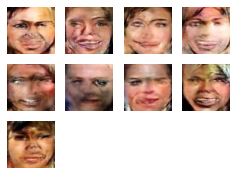

Epoch 66/200
200/200 [==============================] - 127s 631ms/step - d_loss: -90271.9297 - g_loss: -16312.7402


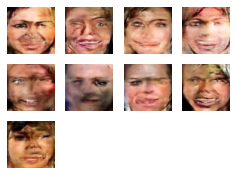

Epoch 67/200
200/200 [==============================] - 127s 630ms/step - d_loss: -90743.8828 - g_loss: -17031.9199


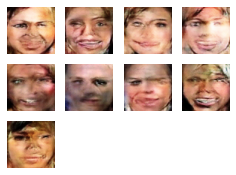

Epoch 68/200
200/200 [==============================] - 127s 631ms/step - d_loss: -94189.6328 - g_loss: -15017.3916


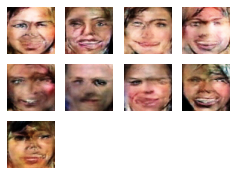

Epoch 69/200
200/200 [==============================] - 127s 630ms/step - d_loss: -93074.3125 - g_loss: -6733.2280


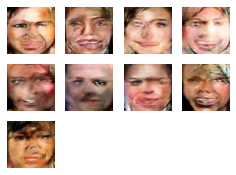

Epoch 70/200
200/200 [==============================] - 127s 630ms/step - d_loss: -94321.7422 - g_loss: -14822.2490


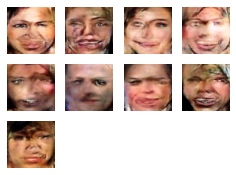

Epoch 71/200
200/200 [==============================] - 127s 631ms/step - d_loss: -94135.3594 - g_loss: -5309.3018


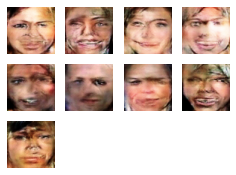

Epoch 72/200
200/200 [==============================] - 127s 631ms/step - d_loss: -95920.5078 - g_loss: 1915.8525


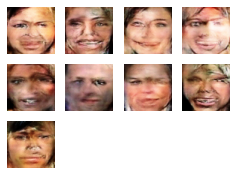

Epoch 73/200
200/200 [==============================] - 127s 631ms/step - d_loss: -93307.3203 - g_loss: 186.4158


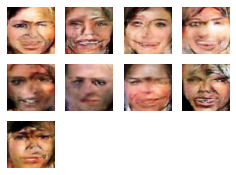

Epoch 74/200
200/200 [==============================] - 127s 630ms/step - d_loss: -94608.5625 - g_loss: 5399.8525


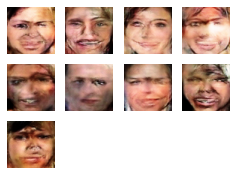

Epoch 75/200
200/200 [==============================] - 127s 630ms/step - d_loss: -96118.0000 - g_loss: 6461.5215


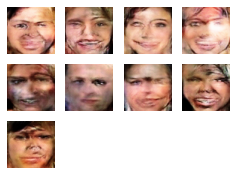

Epoch 76/200
200/200 [==============================] - 127s 630ms/step - d_loss: -100678.4922 - g_loss: -492.3075


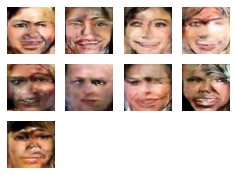

Epoch 77/200
200/200 [==============================] - 127s 630ms/step - d_loss: -101312.3594 - g_loss: 4071.5007


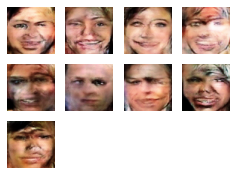

Epoch 78/200
200/200 [==============================] - 127s 630ms/step - d_loss: -102359.8203 - g_loss: 1120.9580


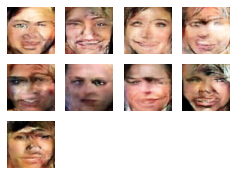

Epoch 79/200
200/200 [==============================] - 127s 630ms/step - d_loss: -101465.4766 - g_loss: 107.1969


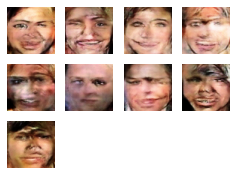

Epoch 80/200
200/200 [==============================] - 127s 630ms/step - d_loss: -104535.9688 - g_loss: -3015.4316


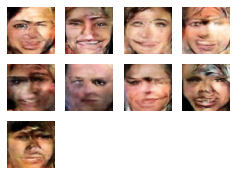

Epoch 81/200
200/200 [==============================] - 127s 631ms/step - d_loss: -104510.8438 - g_loss: -4278.8677


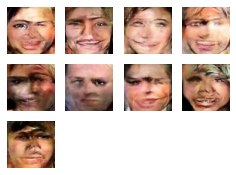

Epoch 82/200
200/200 [==============================] - 127s 631ms/step - d_loss: -106689.4062 - g_loss: 4860.2705


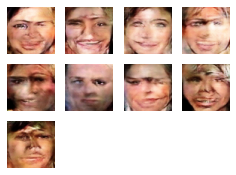

Epoch 83/200
200/200 [==============================] - 127s 631ms/step - d_loss: -110676.4297 - g_loss: 1397.6528


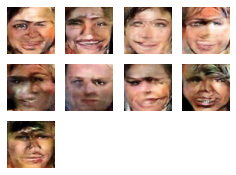

Epoch 84/200
200/200 [==============================] - 127s 630ms/step - d_loss: -111633.4219 - g_loss: 402.6259


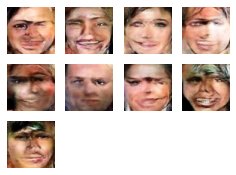

Epoch 85/200
200/200 [==============================] - 127s 630ms/step - d_loss: -114503.1875 - g_loss: 3275.7959


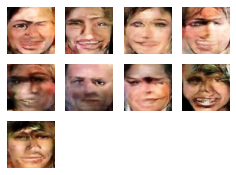

Epoch 86/200
200/200 [==============================] - 127s 630ms/step - d_loss: -117573.8203 - g_loss: -1871.6628


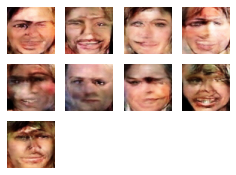

Epoch 87/200
200/200 [==============================] - 127s 631ms/step - d_loss: -120030.8672 - g_loss: 3561.8396


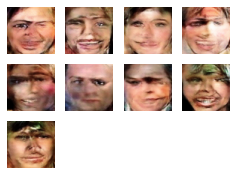

Epoch 88/200
200/200 [==============================] - 127s 630ms/step - d_loss: -120474.4766 - g_loss: 6013.6724


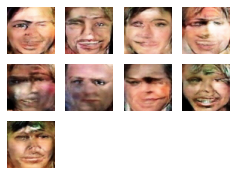

Epoch 89/200
200/200 [==============================] - 127s 631ms/step - d_loss: -121890.8281 - g_loss: 904.5002


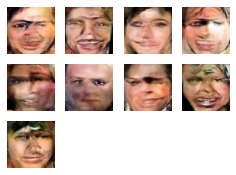

Epoch 90/200
200/200 [==============================] - 127s 630ms/step - d_loss: -124843.2969 - g_loss: 3573.6951


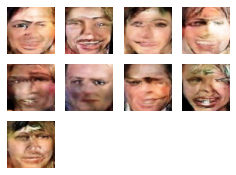

Epoch 91/200
200/200 [==============================] - 127s 630ms/step - d_loss: -127405.1484 - g_loss: 5301.6816


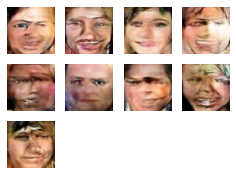

Epoch 92/200
200/200 [==============================] - 127s 631ms/step - d_loss: -130271.6328 - g_loss: 5062.8638


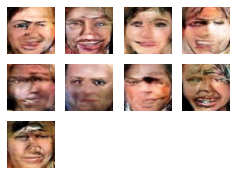

Epoch 93/200
200/200 [==============================] - 127s 631ms/step - d_loss: -128544.4766 - g_loss: 1461.8632


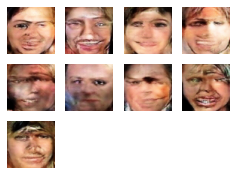

Epoch 94/200
200/200 [==============================] - 127s 631ms/step - d_loss: -132305.4375 - g_loss: -1804.9083


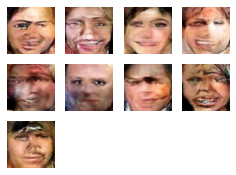

Epoch 95/200
200/200 [==============================] - 127s 630ms/step - d_loss: -133033.0469 - g_loss: -3602.4658


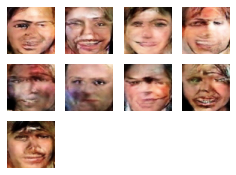

Epoch 96/200
200/200 [==============================] - 127s 631ms/step - d_loss: -136771.3750 - g_loss: -6536.6631


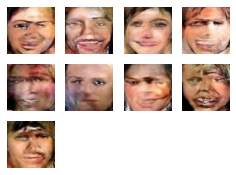

Epoch 97/200
200/200 [==============================] - 127s 631ms/step - d_loss: -137485.4375 - g_loss: 4743.8130


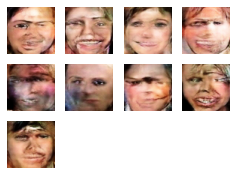

Epoch 98/200
200/200 [==============================] - 127s 630ms/step - d_loss: -141753.5156 - g_loss: 1657.0607


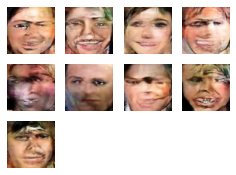

Epoch 99/200
200/200 [==============================] - 127s 630ms/step - d_loss: -140566.7969 - g_loss: 1066.0981


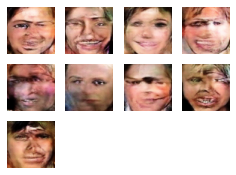

Epoch 100/200
200/200 [==============================] - 127s 631ms/step - d_loss: -144499.6562 - g_loss: 577.6130


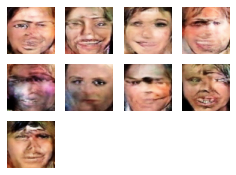

Epoch 101/200
200/200 [==============================] - 127s 631ms/step - d_loss: -145472.4375 - g_loss: 1162.7386


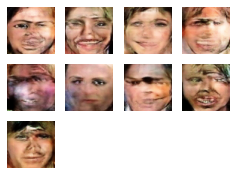

Epoch 102/200
200/200 [==============================] - 127s 630ms/step - d_loss: -149063.8594 - g_loss: -2470.1843


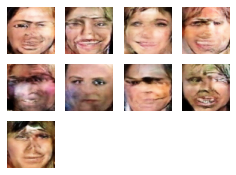

Epoch 103/200
200/200 [==============================] - 127s 631ms/step - d_loss: -150807.0625 - g_loss: 6915.4180


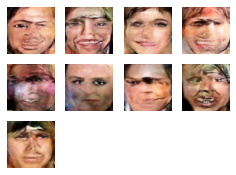

Epoch 104/200
200/200 [==============================] - 127s 631ms/step - d_loss: -152981.4062 - g_loss: 9532.9824


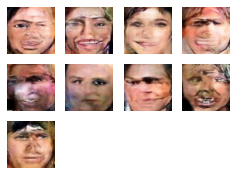

Epoch 105/200
200/200 [==============================] - 127s 631ms/step - d_loss: -156116.6719 - g_loss: 17998.0723


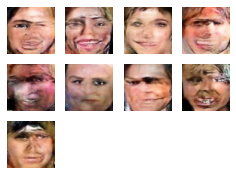

Epoch 106/200
200/200 [==============================] - 127s 631ms/step - d_loss: -158996.9531 - g_loss: 8258.1035


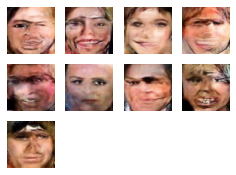

Epoch 107/200
200/200 [==============================] - 127s 631ms/step - d_loss: -161810.3281 - g_loss: 5192.5645


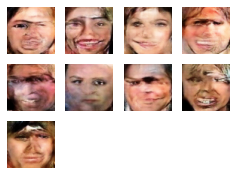

Epoch 108/200
200/200 [==============================] - 127s 631ms/step - d_loss: -161218.7031 - g_loss: 5147.3379


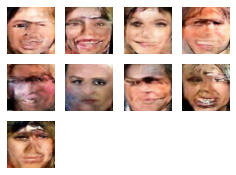

Epoch 109/200
200/200 [==============================] - 127s 631ms/step - d_loss: -162843.3125 - g_loss: 6584.6621


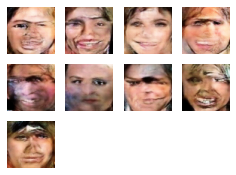

Epoch 110/200
200/200 [==============================] - 127s 631ms/step - d_loss: -165826.4844 - g_loss: 7286.2080


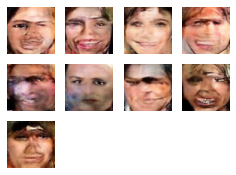

Epoch 111/200
200/200 [==============================] - 127s 632ms/step - d_loss: -167628.7969 - g_loss: 2142.5789


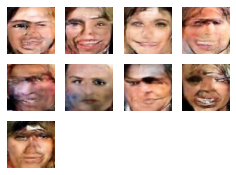

Epoch 112/200
200/200 [==============================] - 127s 631ms/step - d_loss: -167539.7656 - g_loss: 3207.0825


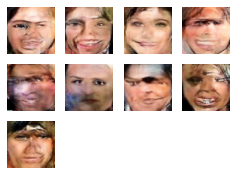

Epoch 113/200
200/200 [==============================] - 127s 632ms/step - d_loss: -174273.7812 - g_loss: 12937.5117


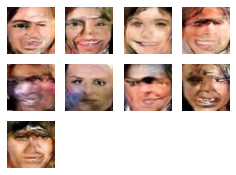

Epoch 114/200
200/200 [==============================] - 127s 631ms/step - d_loss: -174710.5156 - g_loss: 9536.7666


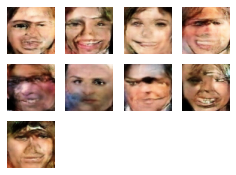

Epoch 115/200
200/200 [==============================] - 127s 631ms/step - d_loss: -178567.7812 - g_loss: -8939.1982


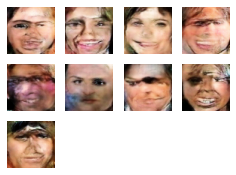

Epoch 116/200
200/200 [==============================] - 127s 631ms/step - d_loss: -177135.1875 - g_loss: -8438.9805


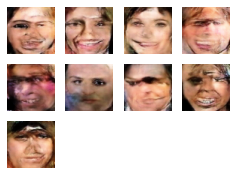

Epoch 117/200
200/200 [==============================] - 127s 631ms/step - d_loss: -181268.4062 - g_loss: 1157.1333


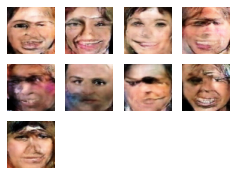

Epoch 118/200
200/200 [==============================] - 128s 632ms/step - d_loss: -181888.9531 - g_loss: 699.7419


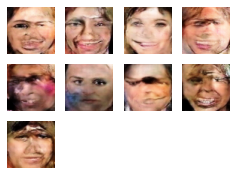

Epoch 119/200
200/200 [==============================] - 127s 631ms/step - d_loss: -181782.6875 - g_loss: 6095.2749


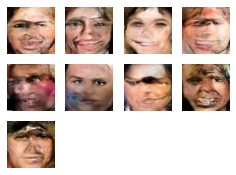

Epoch 120/200
200/200 [==============================] - 127s 631ms/step - d_loss: -185429.6250 - g_loss: 10956.0996


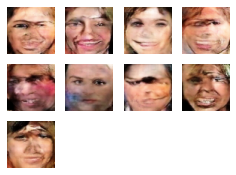

Epoch 121/200
200/200 [==============================] - 127s 631ms/step - d_loss: -188385.7656 - g_loss: 9077.1309


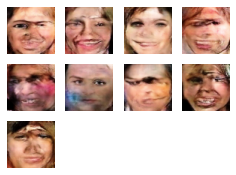

Epoch 122/200
200/200 [==============================] - 127s 631ms/step - d_loss: -192026.7188 - g_loss: 11976.3623


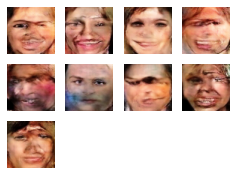

Epoch 123/200
200/200 [==============================] - 127s 631ms/step - d_loss: -192265.8125 - g_loss: 4992.3267


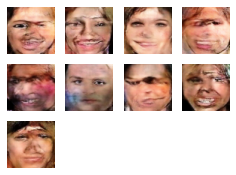

Epoch 124/200
200/200 [==============================] - 127s 632ms/step - d_loss: -197053.9844 - g_loss: 4911.4004


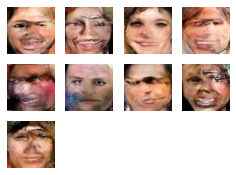

Epoch 125/200
200/200 [==============================] - 127s 631ms/step - d_loss: -197508.2344 - g_loss: 8945.7412


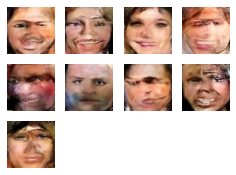

Epoch 126/200
200/200 [==============================] - 127s 631ms/step - d_loss: -201107.2656 - g_loss: 3977.6094


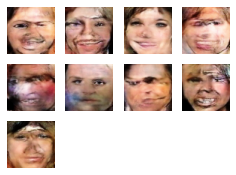

Epoch 127/200
200/200 [==============================] - 127s 631ms/step - d_loss: -203644.9375 - g_loss: 12311.0566


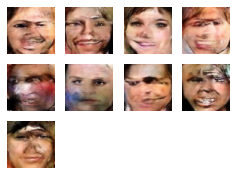

Epoch 128/200
200/200 [==============================] - 127s 631ms/step - d_loss: -212099.3438 - g_loss: 5307.6392


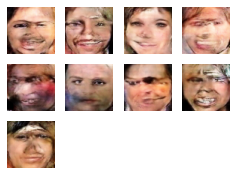

Epoch 129/200
200/200 [==============================] - 127s 631ms/step - d_loss: -216984.9844 - g_loss: 8860.2451


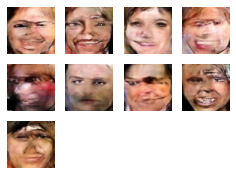

Epoch 130/200
200/200 [==============================] - 127s 631ms/step - d_loss: -219926.0781 - g_loss: 26130.0625


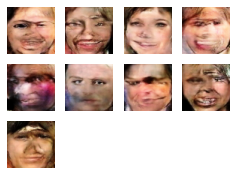

Epoch 131/200
200/200 [==============================] - 127s 631ms/step - d_loss: -219138.2031 - g_loss: 16710.3691


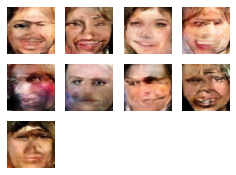

Epoch 132/200
200/200 [==============================] - 127s 631ms/step - d_loss: -220601.4062 - g_loss: 22454.8379


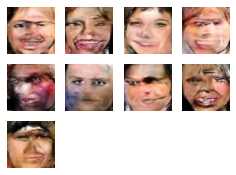

Epoch 133/200
200/200 [==============================] - 127s 631ms/step - d_loss: -225787.5781 - g_loss: 21246.4004


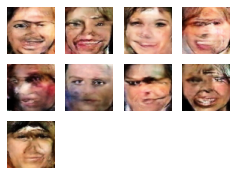

Epoch 134/200
200/200 [==============================] - 127s 631ms/step - d_loss: -225749.0000 - g_loss: 27895.3574


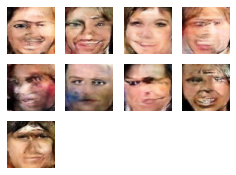

Epoch 135/200
200/200 [==============================] - 127s 631ms/step - d_loss: -230048.2812 - g_loss: 3278.6704


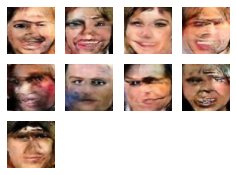

Epoch 136/200
200/200 [==============================] - 128s 632ms/step - d_loss: -235516.3438 - g_loss: 16894.6328


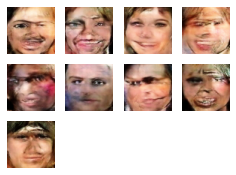

Epoch 137/200
200/200 [==============================] - 127s 631ms/step - d_loss: -239142.1562 - g_loss: 14057.1123


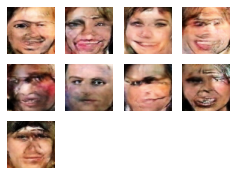

Epoch 138/200
200/200 [==============================] - 127s 631ms/step - d_loss: -235398.6562 - g_loss: 13851.7266


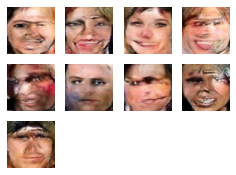

Epoch 139/200
200/200 [==============================] - 127s 631ms/step - d_loss: -239525.7031 - g_loss: 9753.2900


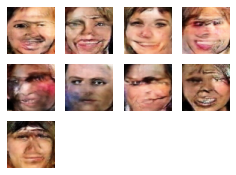

Epoch 140/200
200/200 [==============================] - 127s 631ms/step - d_loss: -245481.5938 - g_loss: 1506.7963


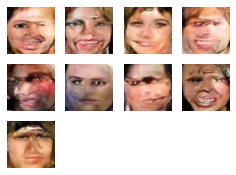

Epoch 141/200
200/200 [==============================] - 127s 631ms/step - d_loss: -246255.1562 - g_loss: 19350.6191


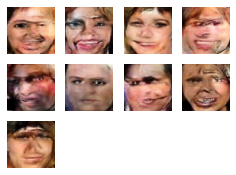

Epoch 142/200
200/200 [==============================] - 127s 631ms/step - d_loss: -257967.2188 - g_loss: 16684.3711


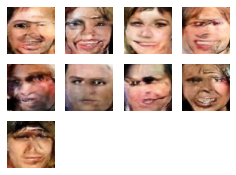

Epoch 143/200
200/200 [==============================] - 127s 631ms/step - d_loss: -257390.7812 - g_loss: 1370.1683


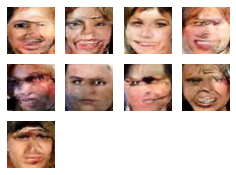

Epoch 144/200
200/200 [==============================] - 127s 631ms/step - d_loss: -261559.7031 - g_loss: 28889.0352


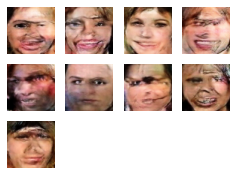

Epoch 145/200
200/200 [==============================] - 127s 631ms/step - d_loss: -263726.7500 - g_loss: 45392.4414


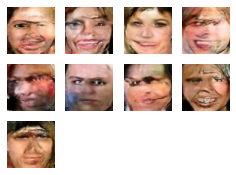

Epoch 146/200
200/200 [==============================] - 127s 631ms/step - d_loss: -267024.1875 - g_loss: 4773.7583


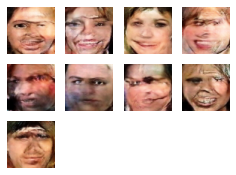

Epoch 147/200
200/200 [==============================] - 127s 631ms/step - d_loss: -271889.5312 - g_loss: 26852.8066


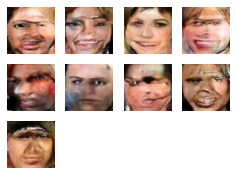

Epoch 148/200
200/200 [==============================] - 127s 631ms/step - d_loss: -273596.8438 - g_loss: 39447.1055


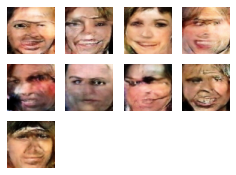

Epoch 149/200
200/200 [==============================] - 127s 631ms/step - d_loss: -278144.7500 - g_loss: 11240.8154


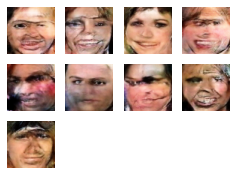

Epoch 150/200
200/200 [==============================] - 127s 631ms/step - d_loss: -279161.9062 - g_loss: 59684.3867


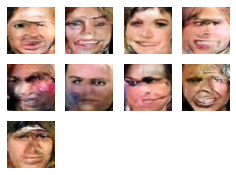

Epoch 151/200
200/200 [==============================] - 127s 631ms/step - d_loss: -284904.8750 - g_loss: 36626.1172


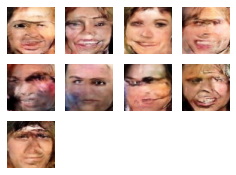

Epoch 152/200
200/200 [==============================] - 127s 631ms/step - d_loss: -289203.6250 - g_loss: 17157.7129


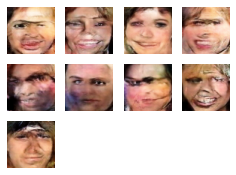

Epoch 153/200
200/200 [==============================] - 127s 631ms/step - d_loss: -295495.6562 - g_loss: 37830.5469


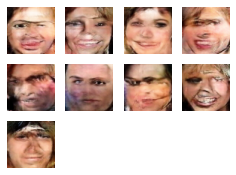

Epoch 154/200
200/200 [==============================] - 127s 631ms/step - d_loss: -291204.4375 - g_loss: 35549.1602


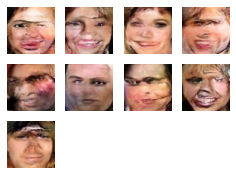

Epoch 155/200
200/200 [==============================] - 127s 631ms/step - d_loss: -306940.3750 - g_loss: 17503.8574


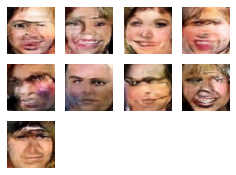

Epoch 156/200
200/200 [==============================] - 127s 631ms/step - d_loss: -304263.5312 - g_loss: 55171.4492


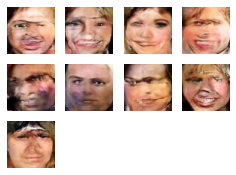

Epoch 157/200
200/200 [==============================] - 127s 631ms/step - d_loss: -311335.0000 - g_loss: 12744.7109


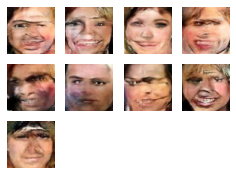

Epoch 158/200
200/200 [==============================] - 127s 631ms/step - d_loss: -317465.6875 - g_loss: 40369.2539


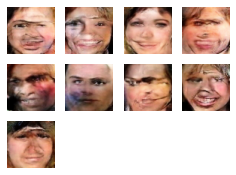

Epoch 159/200
200/200 [==============================] - 127s 631ms/step - d_loss: -320081.7500 - g_loss: 32094.7969


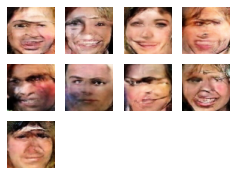

Epoch 160/200
200/200 [==============================] - 127s 632ms/step - d_loss: -322410.1562 - g_loss: 37351.8086


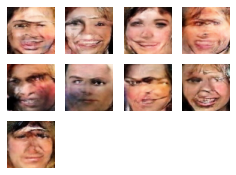

Epoch 161/200
200/200 [==============================] - 127s 631ms/step - d_loss: -326900.4688 - g_loss: 73279.5625


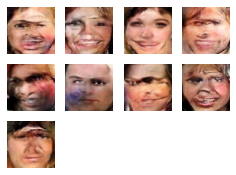

Epoch 162/200
200/200 [==============================] - 127s 631ms/step - d_loss: -333201.9375 - g_loss: 14790.1260


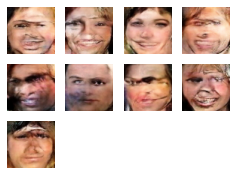

Epoch 163/200
200/200 [==============================] - 127s 631ms/step - d_loss: -344248.7500 - g_loss: -22058.6543


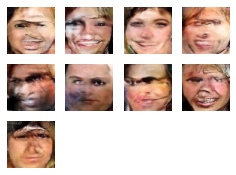

Epoch 164/200
200/200 [==============================] - 127s 631ms/step - d_loss: -343059.5312 - g_loss: 17077.9570


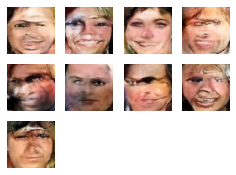

Epoch 165/200
200/200 [==============================] - 127s 631ms/step - d_loss: -347667.8438 - g_loss: 28871.4844


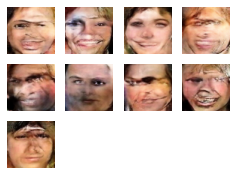

Epoch 166/200
200/200 [==============================] - 128s 631ms/step - d_loss: -352779.7500 - g_loss: 21294.3906


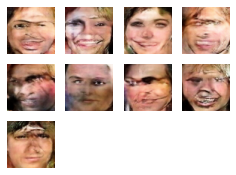

Epoch 167/200
200/200 [==============================] - 127s 631ms/step - d_loss: -355215.3125 - g_loss: 37438.5469


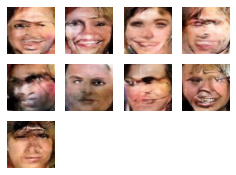

Epoch 168/200
200/200 [==============================] - 127s 632ms/step - d_loss: -360771.0000 - g_loss: 27030.8203


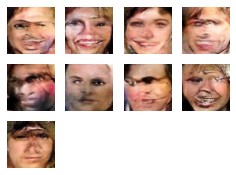

Epoch 169/200
200/200 [==============================] - 127s 631ms/step - d_loss: -367651.7500 - g_loss: 48488.3086


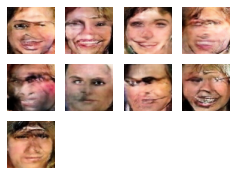

Epoch 170/200
200/200 [==============================] - 127s 631ms/step - d_loss: -365384.4375 - g_loss: 47170.7695


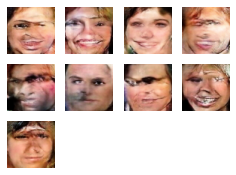

Epoch 171/200
200/200 [==============================] - 127s 632ms/step - d_loss: -371344.1562 - g_loss: 72419.5078


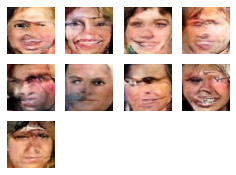

Epoch 172/200
200/200 [==============================] - 127s 631ms/step - d_loss: -373552.4062 - g_loss: 62860.5508


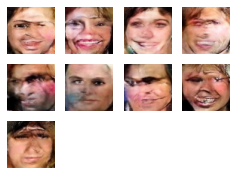

Epoch 173/200
200/200 [==============================] - 128s 632ms/step - d_loss: -376162.0312 - g_loss: 51509.8086


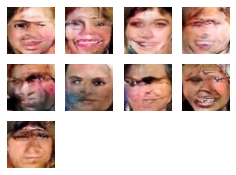

Epoch 174/200
200/200 [==============================] - 127s 631ms/step - d_loss: -378807.3750 - g_loss: 75324.6328


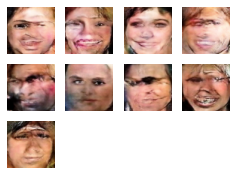

Epoch 175/200
200/200 [==============================] - 127s 631ms/step - d_loss: -382335.8125 - g_loss: 5724.9829


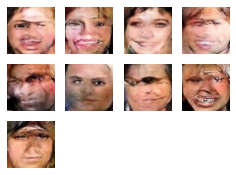

Epoch 176/200
200/200 [==============================] - 127s 631ms/step - d_loss: -390921.4062 - g_loss: 35877.8750


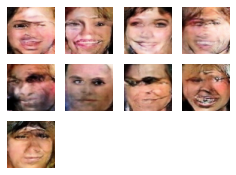

Epoch 177/200
200/200 [==============================] - 128s 632ms/step - d_loss: -391707.8750 - g_loss: 61446.0703


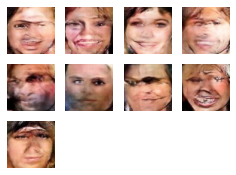

Epoch 178/200
200/200 [==============================] - 127s 631ms/step - d_loss: -395198.2812 - g_loss: 85643.5000


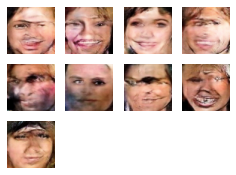

Epoch 179/200
200/200 [==============================] - 127s 631ms/step - d_loss: -402741.7188 - g_loss: 21952.7246


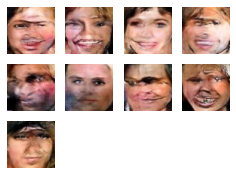

Epoch 180/200
200/200 [==============================] - 127s 631ms/step - d_loss: -403166.4688 - g_loss: 43419.4102


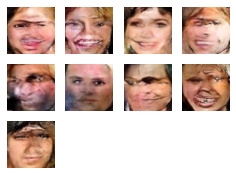

Epoch 181/200
200/200 [==============================] - 127s 631ms/step - d_loss: -409593.7500 - g_loss: 103165.9219


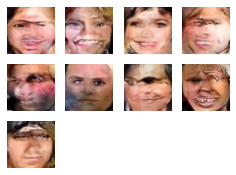

Epoch 182/200
200/200 [==============================] - 127s 631ms/step - d_loss: -404394.1250 - g_loss: 77164.5312


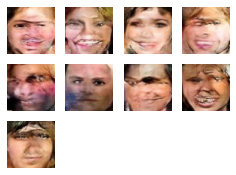

Epoch 183/200
200/200 [==============================] - 127s 631ms/step - d_loss: -413815.0938 - g_loss: 37255.8906


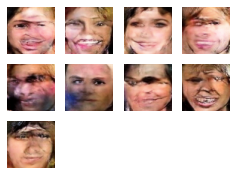

Epoch 184/200
200/200 [==============================] - 127s 631ms/step - d_loss: -422678.0312 - g_loss: 1055.1172


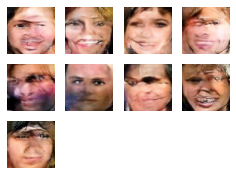

Epoch 185/200
200/200 [==============================] - 127s 631ms/step - d_loss: -428558.4062 - g_loss: 28991.9102


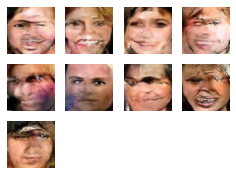

Epoch 186/200
200/200 [==============================] - 127s 631ms/step - d_loss: -432622.5312 - g_loss: 91763.0625


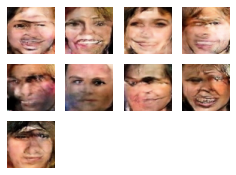

Epoch 187/200
200/200 [==============================] - 127s 631ms/step - d_loss: -438156.1250 - g_loss: 62708.1719


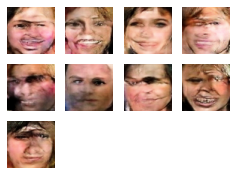

Epoch 188/200
200/200 [==============================] - 128s 632ms/step - d_loss: -448367.3750 - g_loss: 142936.4844


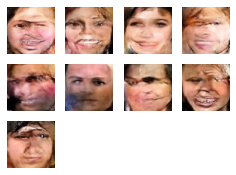

Epoch 189/200
200/200 [==============================] - 127s 631ms/step - d_loss: -443632.5938 - g_loss: 84752.0312


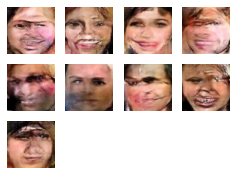

Epoch 190/200
200/200 [==============================] - 127s 631ms/step - d_loss: -447453.8125 - g_loss: 85494.2188


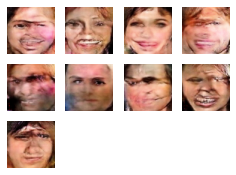

Epoch 191/200
200/200 [==============================] - 127s 631ms/step - d_loss: -451032.7500 - g_loss: 132981.4062


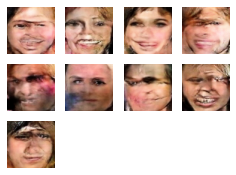

Epoch 192/200
200/200 [==============================] - 128s 632ms/step - d_loss: -455946.4688 - g_loss: 153204.9688


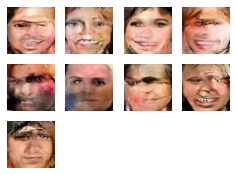

Epoch 193/200
200/200 [==============================] - 127s 631ms/step - d_loss: -455483.0312 - g_loss: 26109.7383


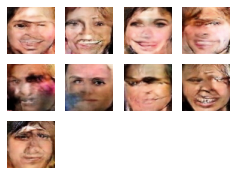

Epoch 194/200
200/200 [==============================] - 127s 631ms/step - d_loss: -458546.2812 - g_loss: 83548.4609


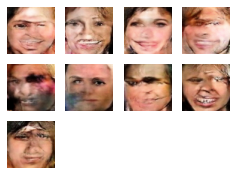

Epoch 195/200
200/200 [==============================] - 127s 631ms/step - d_loss: -478420.3750 - g_loss: 143113.9062


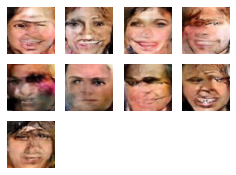

Epoch 196/200
200/200 [==============================] - 127s 631ms/step - d_loss: -466310.3125 - g_loss: 175912.7969


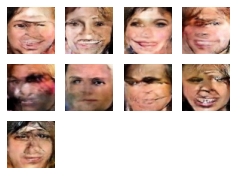

Epoch 197/200
200/200 [==============================] - 127s 631ms/step - d_loss: -474117.7188 - g_loss: 53680.6406


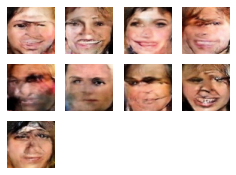

Epoch 198/200
200/200 [==============================] - 127s 631ms/step - d_loss: -485654.3750 - g_loss: 187475.7188


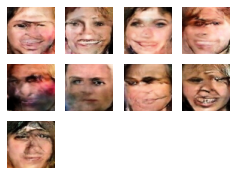

Epoch 199/200
200/200 [==============================] - 127s 631ms/step - d_loss: -485067.1875 - g_loss: 192361.7031


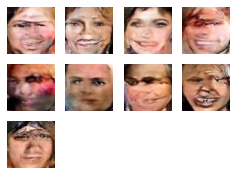

Epoch 200/200
200/200 [==============================] - 127s 631ms/step - d_loss: -492381.8125 - g_loss: 93378.5703


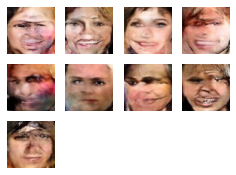

In [23]:
NUM_EPOCHS = 200 # number of epochs
wgan.fit(train_images, epochs=NUM_EPOCHS, callbacks=[GANMonitor(num_img=9, latent_dim=LATENT_DIM)])

In [24]:
generator.save('wgan_generator.h5')
critic.save("critic_discriminator.h5")